### EDA

In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

plt.style.use("fivethirtyeight")

pd.options.display.max_columns = None #make all columns visible when printing the dataframe

In [2]:
delivery_data = pd.read_csv("naqsh route dataset.csv")
delivery_data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


# Data Cleaning
- Clean target and feature variables from unnecesarry information 
- Handle NaN values

In [3]:
delivery_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  object 
 3   Delivery_person_Ratings      45593 non-null  object 
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Order_Date                   45593 non-null  object 
 9   Time_Orderd                  45593 non-null  object 
 10  Time_Order_picked            45593 non-null  object 
 11  Weatherconditions            45593 non-null  object 
 12  Road_traffic_density         45593 non-null  object 
 13  Vehicle_conditio

In [4]:
#Remove "min" string from target variable and get numerical target

delivery_data["Time_taken(min)"] = delivery_data["Time_taken(min)"].apply(lambda x: x[len("(min) "):]).astype(int)
delivery_data.rename(columns={"Time_taken(min)" : "Time_taken"},inplace=True)

In [5]:
delivery_data["Weatherconditions"].unique()

array(['conditions Sunny', 'conditions Stormy', 'conditions Sandstorms',
       'conditions Cloudy', 'conditions Fog', 'conditions Windy',
       'conditions NaN'], dtype=object)

In [6]:
print(delivery_data["Road_traffic_density"].unique())

['High ' 'Jam ' 'Low ' 'Medium ' 'NaN ']


In [7]:
#It seems "NaN" strings have a space after them, convert both "NaN " and "NaN" to object Null values

delivery_data.replace("NaN ", np.nan, inplace=True)
delivery_data.replace("NaN", np.nan, inplace=True)

delivery_data.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken                        0
dtype: int64

In [8]:
#drop null values
delivery_data = delivery_data.dropna()

In [9]:
delivery_data.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
Time_taken                     0
dtype: int64

#  Feature Generation & Explarotary Data Analysis
- Extract new features from existing features to enrich the dataset
- Visualize how delivery time changes w.r.t features
- Examine the relationships of features over delivery time

### a) Generate New Features

In [10]:
from geopy.distance import geodesic

# Assuming df is your DataFrame
delivery_data['Distance'] = delivery_data.apply(lambda row: geodesic((row['Restaurant_latitude'], row['Restaurant_longitude']),
                                               (row['Delivery_location_latitude'], row['Delivery_location_longitude'])).km, axis=1)

In [11]:
def prep_time(df):

    '''
    Convert order time and order_picked times to datetime objects and extract time information and calculate preperation time
    '''

    df["order_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Orderd"], dayfirst=True)
    df["picked_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Order_picked"], dayfirst=True)

    df = df.drop(["Order_Date", "Time_Orderd", "Time_Order_picked"], axis=1)

    df["ordered_hour"] = df["order_datetime"].apply(lambda x: x.hour)
    df["ordered_min"] = df["order_datetime"].apply(lambda x: x.minute)

    df["picked_hour"] = df["picked_datetime"].apply(lambda x: x.hour)
    df["picked_min"] = df["picked_datetime"].apply(lambda x: x.minute)

    def calc_prep_time(ord_hour, ord_min, pc_hour, pc_min):

        '''
        Calculating order preperation times. Careful about:
            - orders given before hour 24 and picked after hour 24
            - order preperation times bigger than 60 minutes
        '''

        if ord_hour == pc_hour:
            if pc_min > ord_min:
                return pc_min - ord_min
            else:
                return 0

        else:
            return 60 - ord_min + pc_min

    df["prep_min"] = df.iloc[:,-4:].apply(lambda x: calc_prep_time(*x), axis=1)

    return df

delivery_data = prep_time(delivery_data)

In [12]:
def create_date_intervals(df):

    '''
    Create date intervals as; is weekend or not, periods of month and quarters of year
    '''

    df["is_weekend"] = delivery_data["order_datetime"].dt.day_of_week > 4

    df["month_intervals"] = df["order_datetime"].apply(lambda x: "start_month" if x.day <=10
                                                   else ("middle_month" if x.day <= 20 else "end_month"))

    df["year_quarter"] = df["order_datetime"].apply(lambda x: x.quarter)

    return df

delivery_data = create_date_intervals(delivery_data)

In [13]:
variables_df = delivery_data.copy()

variables_df = variables_df.drop(["ID", "Delivery_person_ID", "order_datetime",
                            "picked_datetime", "picked_hour", "picked_min"], axis=1)

variables_df.head()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken,Distance,ordered_hour,ordered_min,prep_min,is_weekend,month_intervals,year_quarter
0,37,4.9,22.745049,75.892471,22.765049,75.912471,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,24,3.020737,11,30,15,True,middle_month,1
1,34,4.5,12.913041,77.683237,13.043041,77.813237,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,33,20.143737,19,45,5,False,end_month,1
2,23,4.4,12.914264,77.678400,12.924264,77.688400,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,26,1.549693,8,30,15,True,middle_month,1
3,38,4.7,11.003669,76.976494,11.053669,77.026494,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,21,7.774497,18,0,10,False,start_month,2
4,32,4.6,12.972793,80.249982,13.012793,80.289982,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,30,6.197898,13,30,15,True,end_month,1


In [14]:
variables_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41368 entries, 0 to 45592
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Delivery_person_Age          41368 non-null  object 
 1   Delivery_person_Ratings      41368 non-null  object 
 2   Restaurant_latitude          41368 non-null  float64
 3   Restaurant_longitude         41368 non-null  float64
 4   Delivery_location_latitude   41368 non-null  float64
 5   Delivery_location_longitude  41368 non-null  float64
 6   Weatherconditions            41368 non-null  object 
 7   Road_traffic_density         41368 non-null  object 
 8   Vehicle_condition            41368 non-null  int64  
 9   Type_of_order                41368 non-null  object 
 10  Type_of_vehicle              41368 non-null  object 
 11  multiple_deliveries          41368 non-null  object 
 12  Festival                     41368 non-null  object 
 13  City                 

In [15]:
variables_df.describe()

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition,Time_taken,Distance,ordered_hour,ordered_min,prep_min,year_quarter
count,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000,41368.000000
mean,17.254366,70.777471,17.472437,70.841351,0.995891,26.553350,26.809480,17.436569,29.566090,9.989243,1.139407
std,7.691357,21.122080,7.337077,21.122283,0.817995,9.334363,297.297207,4.793826,16.616645,4.086094,0.346375
min,-30.902872,0.000000,0.010000,0.010000,0.000000,10.000000,1.463837,0.000000,0.000000,5.000000,1.000000
25%,12.933298,73.170283,12.989096,73.279083,0.000000,19.000000,4.654290,15.000000,15.000000,5.000000,1.000000
50%,18.554382,75.898497,18.636258,76.002471,1.000000,26.000000,9.251429,19.000000,30.000000,10.000000,1.000000
75%,22.732225,78.046106,22.785536,78.107097,2.000000,33.000000,13.713520,21.000000,45.000000,15.000000,1.000000
max,30.914057,88.433452,31.054057,88.563452,2.000000,54.000000,6852.617172,23.000000,55.000000,15.000000,2.000000


### Bivariate Analysis

In [17]:
target = "Time_taken"
numerical_features = ["Delivery_person_Age", "Delivery_person_Ratings", "Distance",
                      "ordered_hour", "ordered_min", "prep_min"]

categorical_features = list(variables_df.drop(columns=numerical_features + [target], axis=1).columns)

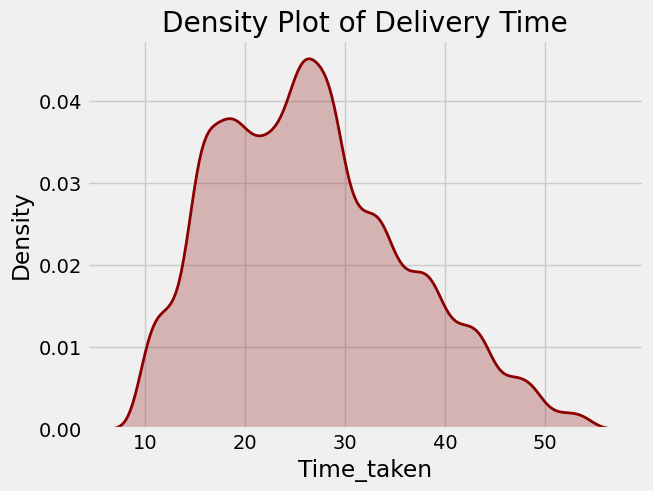

In [18]:
sns.kdeplot(data=variables_df, x=target, shade=True, color="darkred", lw=2)
plt.title("Density Plot of Delivery Time")
plt.show()

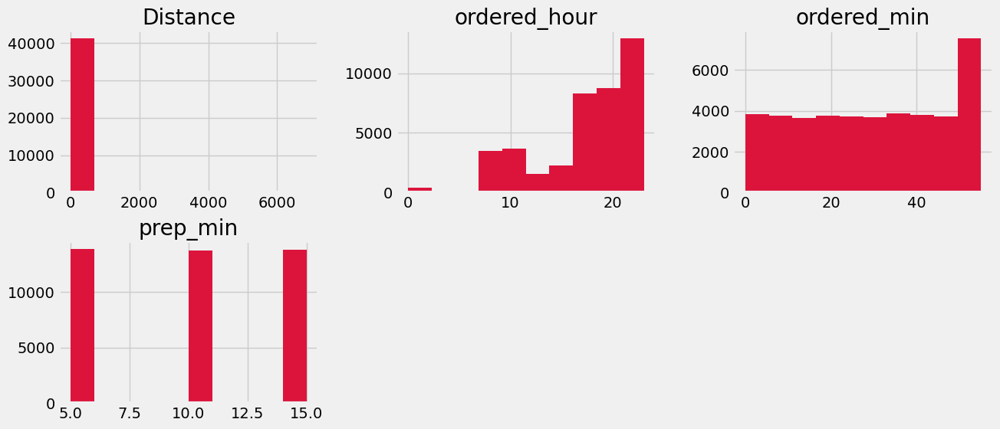

In [19]:
variables_df[numerical_features].hist(layout=(2,3), figsize=(14,6), color="crimson")
plt.show()

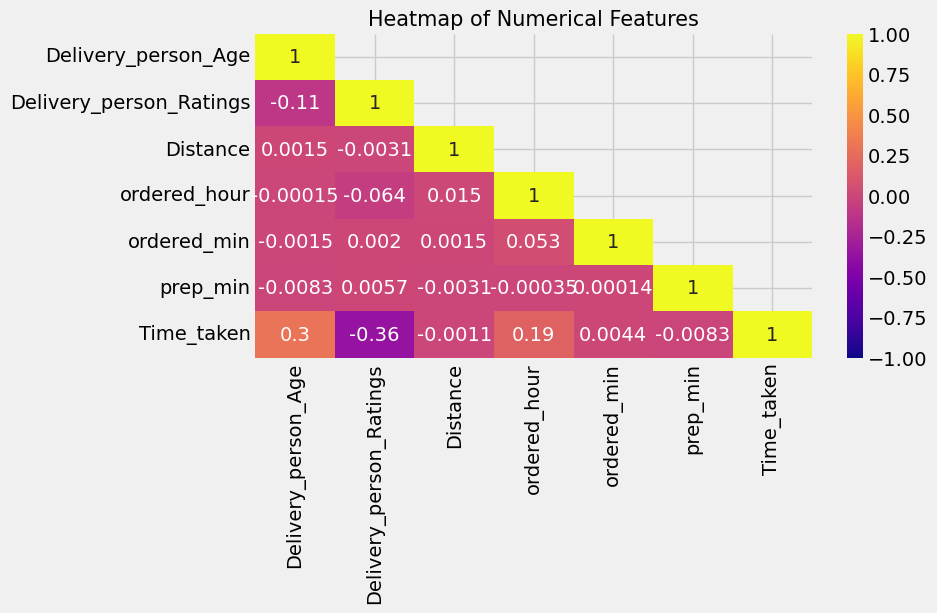

In [20]:
plt.figure(figsize=(8,4))

corr = variables_df[numerical_features+[target]].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(mask, False)

sns.heatmap(corr, annot=True, mask=mask,
    vmin=-1, vmax=1, cmap='plasma'
    )

plt.title("Heatmap of Numerical Features", fontsize=15)
plt.show()

In [21]:
len(categorical_features)

15

In [22]:
categorical_features

['Restaurant_latitude',
 'Restaurant_longitude',
 'Delivery_location_latitude',
 'Delivery_location_longitude',
 'Weatherconditions',
 'Road_traffic_density',
 'Vehicle_condition',
 'Type_of_order',
 'Type_of_vehicle',
 'multiple_deliveries',
 'Festival',
 'City',
 'is_weekend',
 'month_intervals',
 'year_quarter']

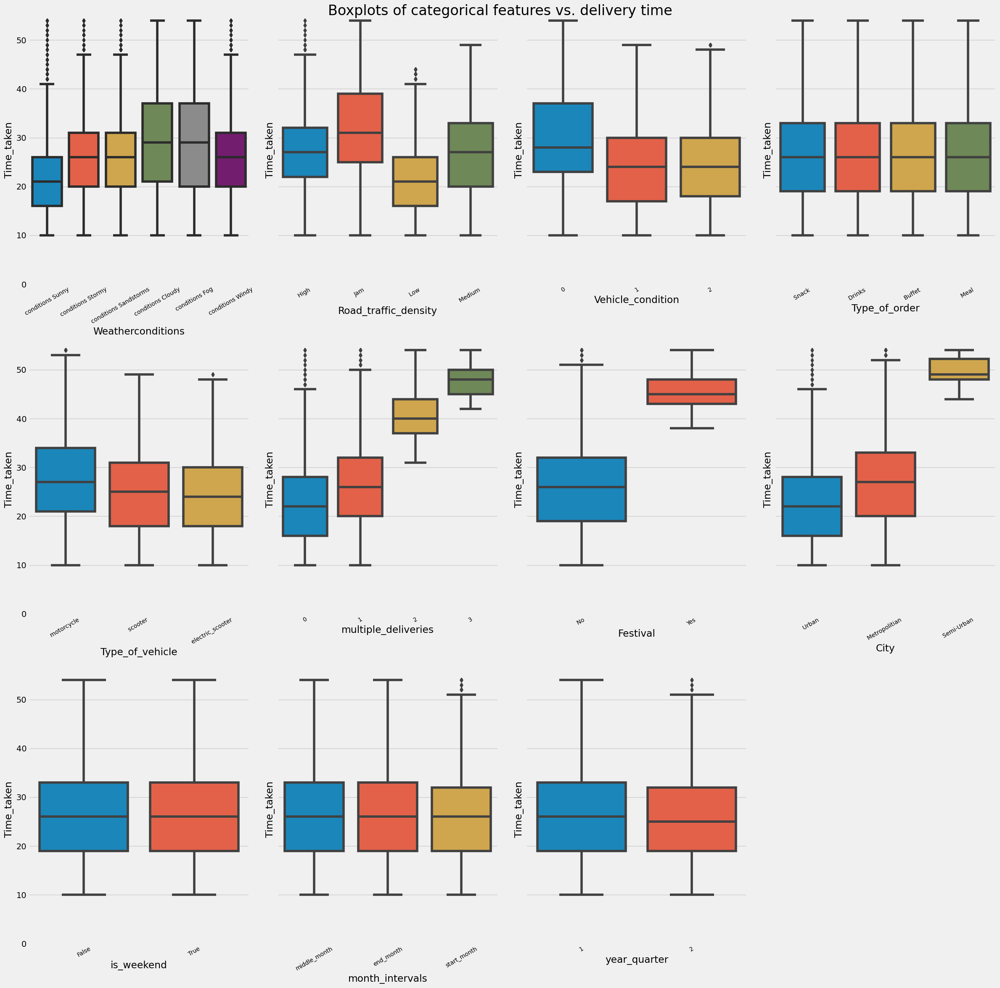

In [ ]:
fig, ax = plt.subplots(3,4, figsize=(24,24), sharey=True)
fig.set_tight_layout(True)

row,col = 0,0

for var in categorical_features:
    sns.boxplot(data=variables_df, x=var, y=target, ax=ax[row,col])
    ''' Creates a boxplot for the current categorical feature ('var')
    against the target variable ('target/ Time_taken') and assigns it to the corresponding subplot.
    '''
    ax[row,col].set_ylim([0,55])
    xlabels = ax[row,col].get_xticklabels()
    ax[row,col].set_xticklabels(xlabels, size=10, rotation=30)

    if col < 3:
        col += 1
    else:
        row += 1
        col = 0

fig.delaxes(ax[2,3]) #delete empty plot
fig.suptitle("Boxplots of categorical features vs. delivery time", fontsize=24)
plt.show()

### Multivariate Analysis

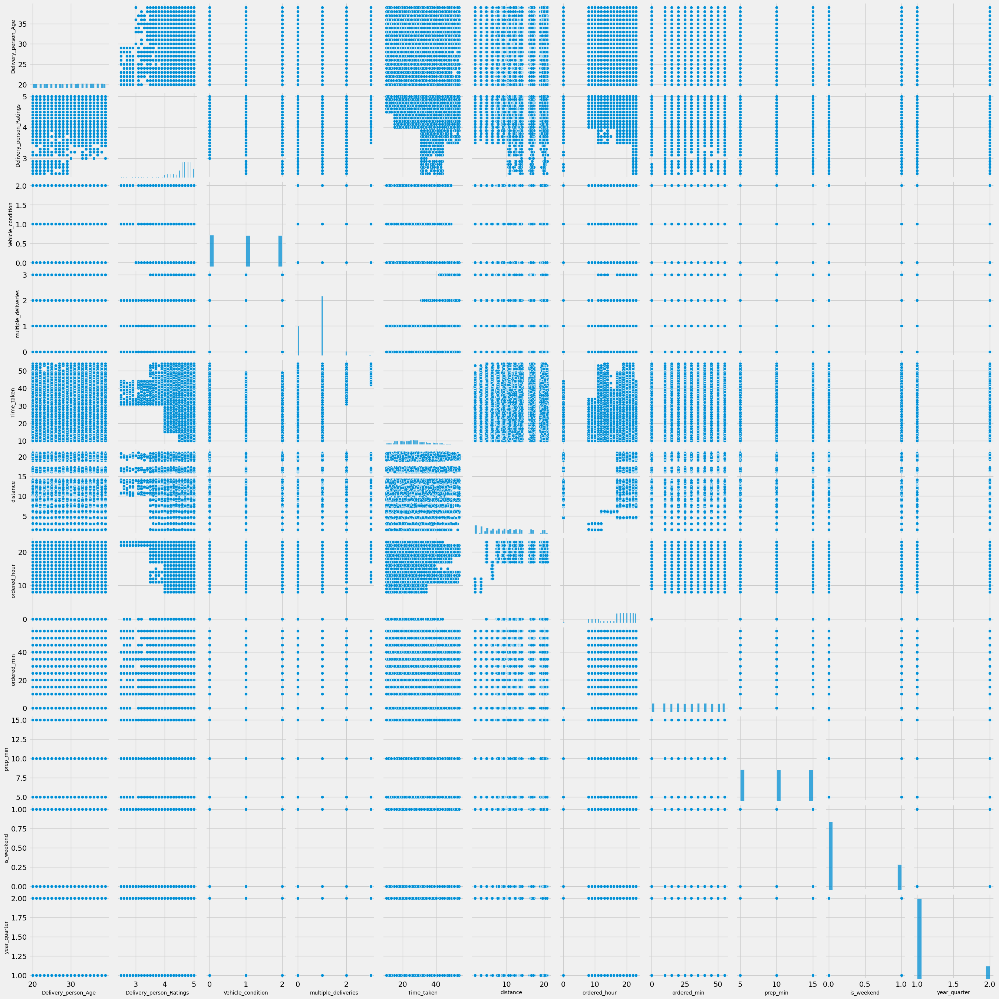

In [ ]:
sns.set_context(rc={"axes.labelsize":10})
sns.pairplot(data=variables_df)
''' A pair plot is a grid of scatterplots for each pair of variables in the DataFrame. 
    It shows the relationship between each pair of variables and displays the distribution of each variable on the diagonal
'''
plt.show()

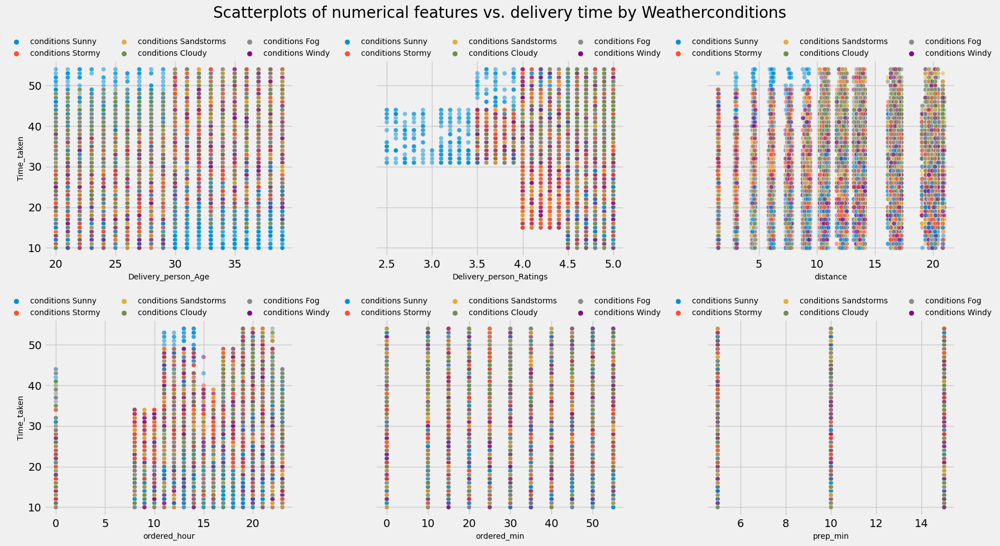

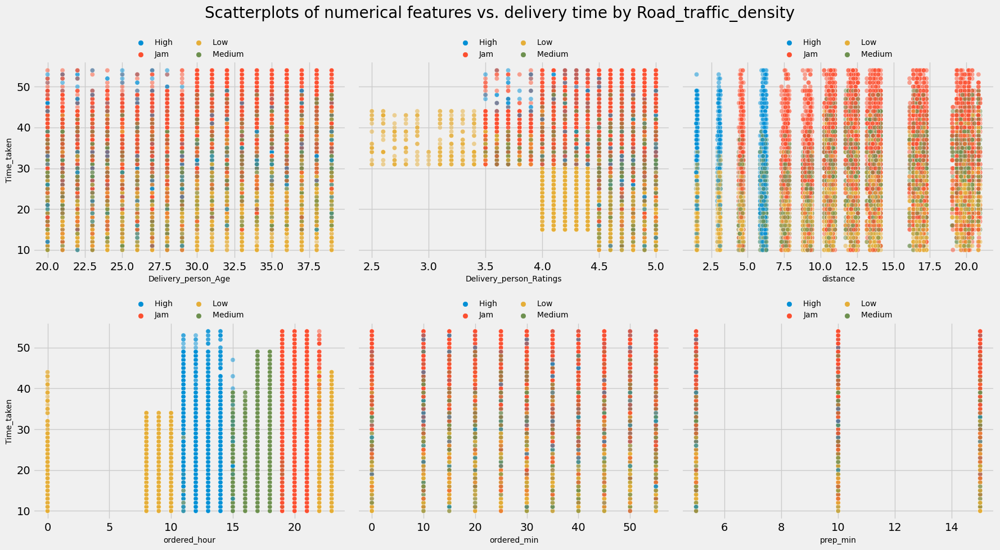

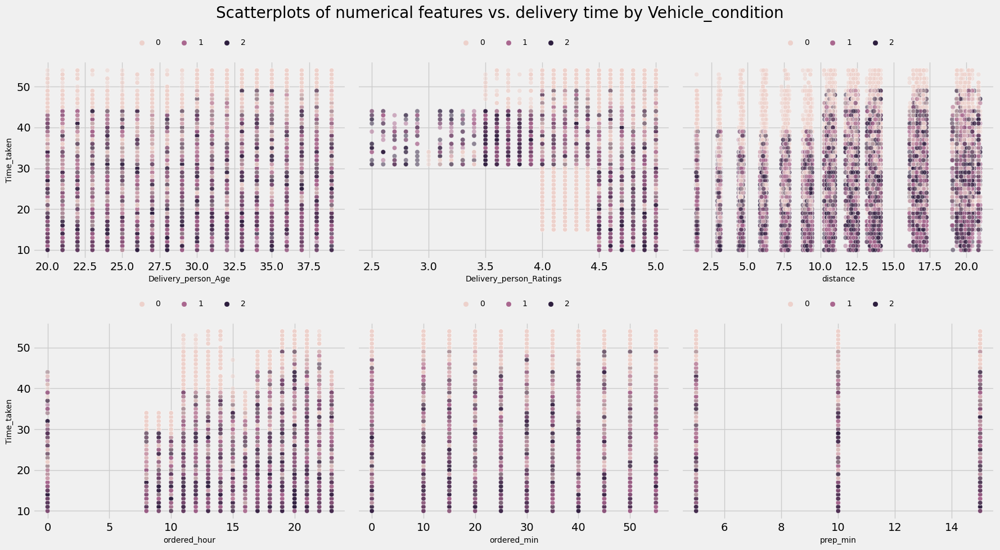

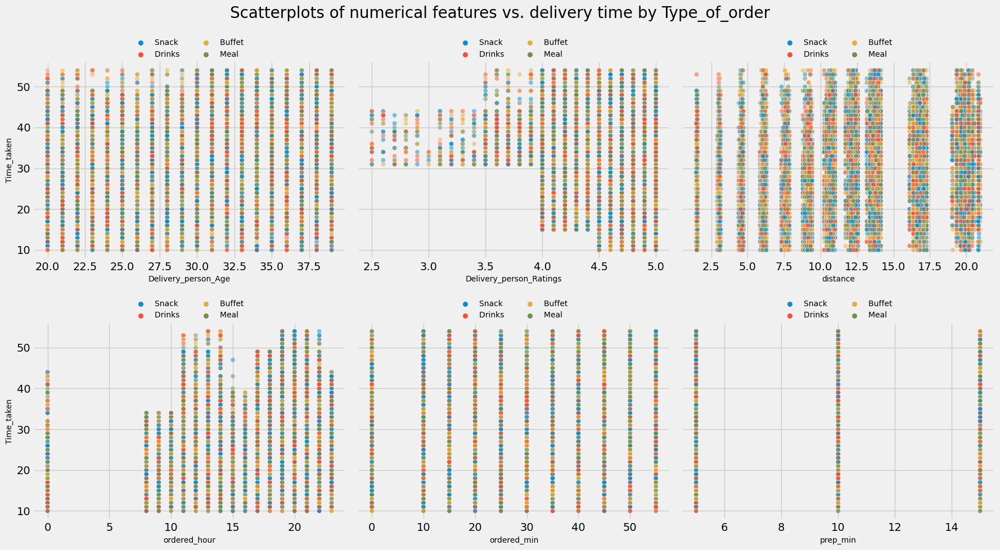

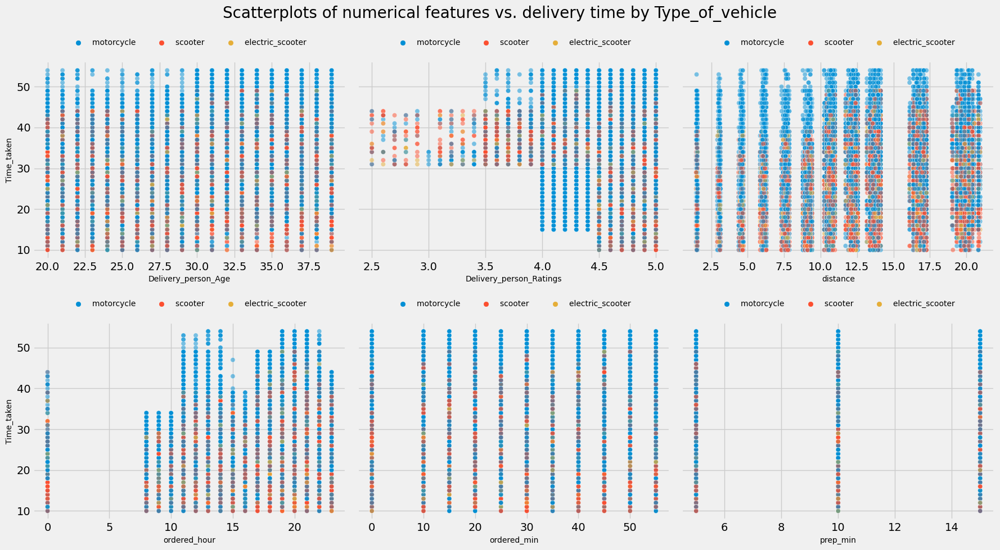

...

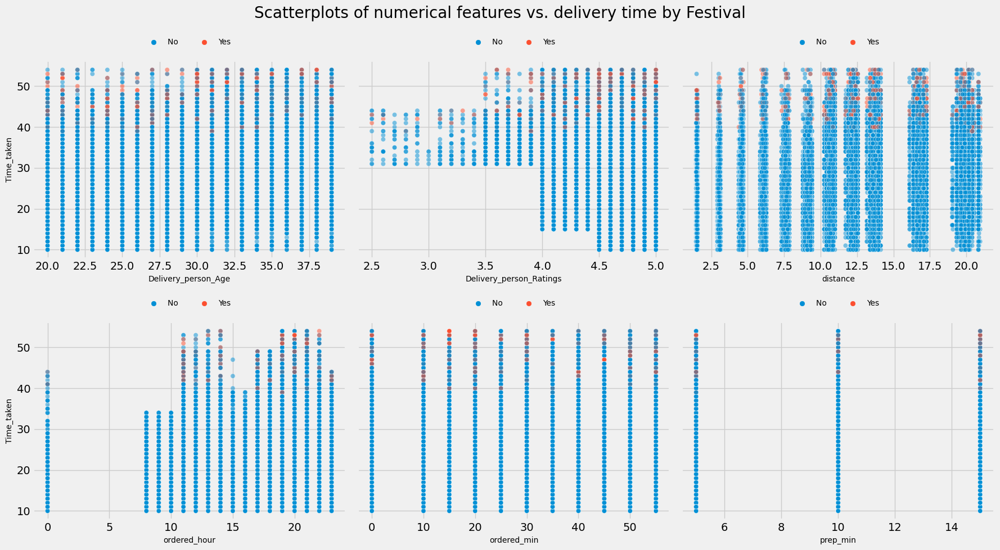

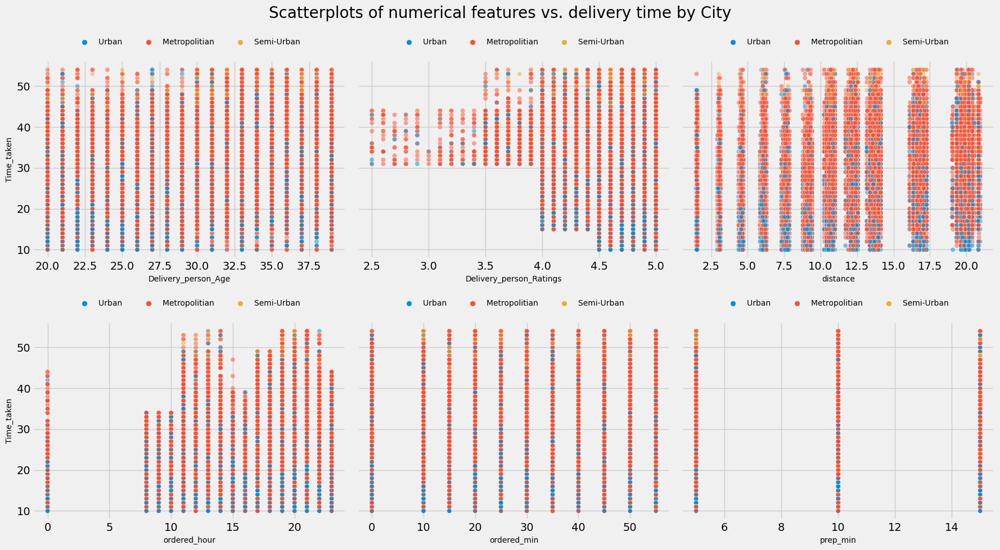

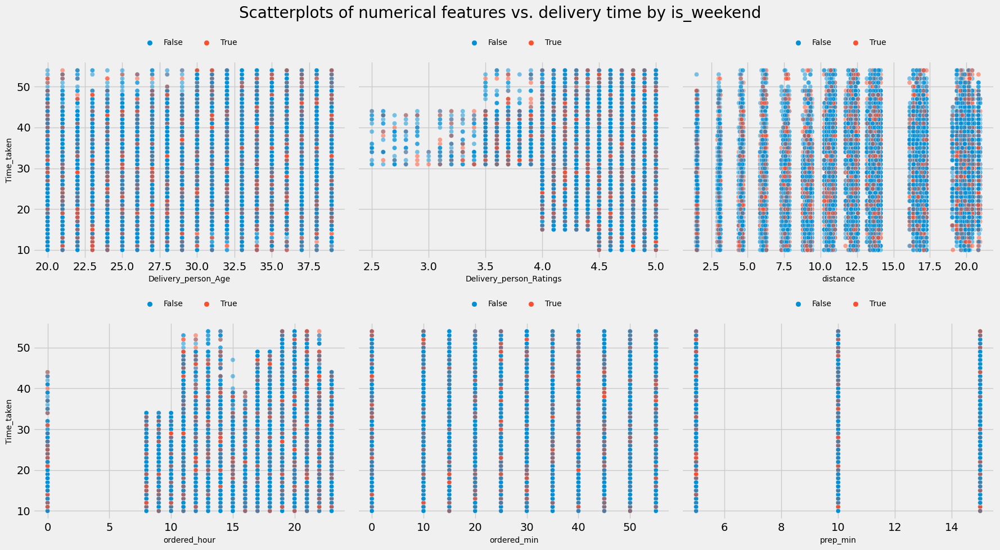

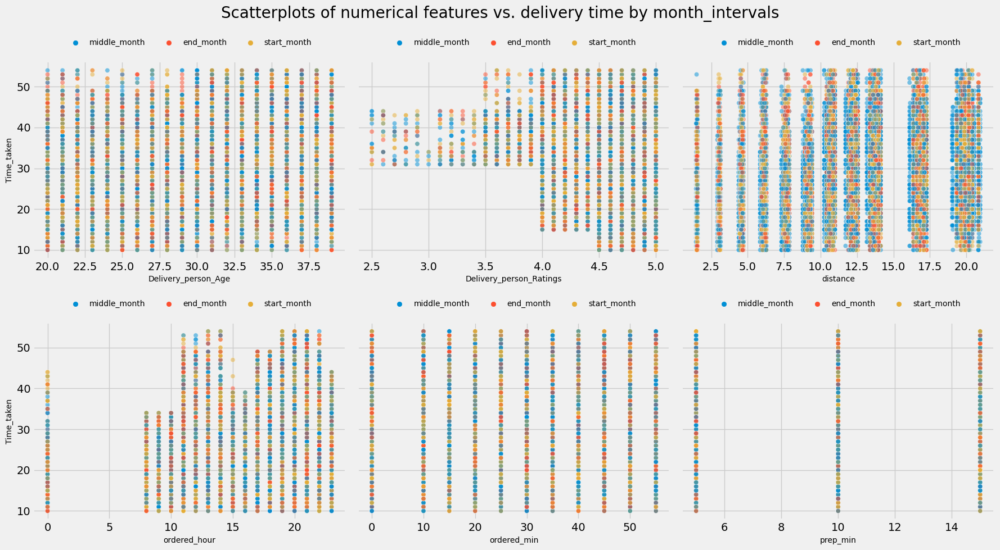

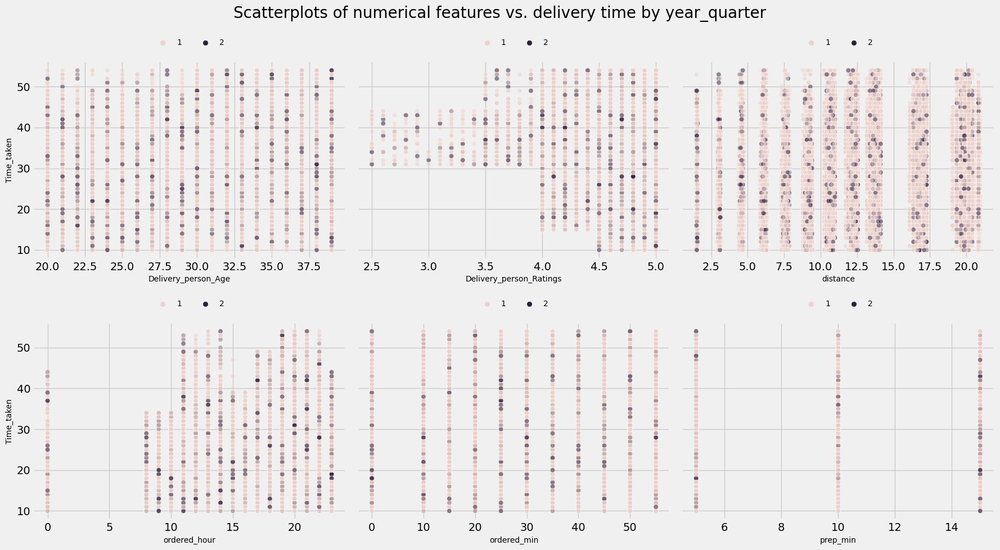

In [ ]:
for category in categorical_features:
    fig, ax = plt.subplots(2,3, figsize=(18,10), sharey=True)
    fig.set_tight_layout(True)

    row,col = 0,0

    for var in numerical_features:
        sns.scatterplot(data=variables_df, x=var, y=target, hue=category, ax=ax[row,col], alpha=0.5)
        ''' Creates a scatterplot for the current numerical feature against the target variable,
        with points colored by the unique values in the current categorical feature.
        '''

        ax[row,col].legend(
            loc='upper center',frameon=False, bbox_to_anchor=(0.5, 1.15), fontsize=10,
            ncol=len(variables_df[category].unique()) if len(variables_df[category].unique()) < 4 else len(variables_df[category].unique())//2
            )

        if col < 2:
            col += 1
        else:
            row += 1
            col = 0

    fig.suptitle(f'Scatterplots of numerical features vs. delivery time by {category}', fontsize=20)
    plt.show()

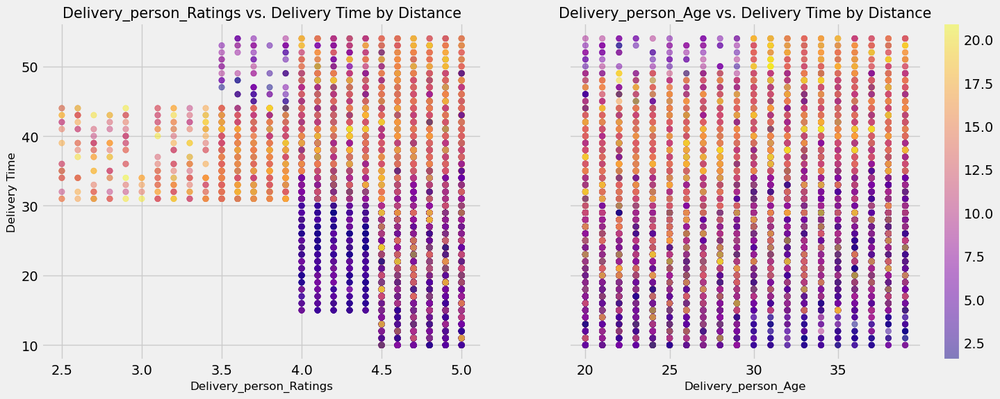

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(16,6), sharey=True)
cm = plt.cm.get_cmap('plasma') #Defines a colormap ("plasma") that will be used to map colors to the points in the scatter plot.

for i,delivery in enumerate(["Delivery_person_Ratings", "Delivery_person_Age"]):
    plot = ax[i].scatter(x=variables_df[delivery], y=variables_df[target], c=variables_df["Distance"], alpha=0.5, cmap=cm)
    ax[i].set_xlabel(delivery, fontsize=12)
    ax[i].set_title(delivery + " vs. Delivery Time by Distance", fontsize=15)
    ''' Creates a scatter plot for the current delivery-related feature against
    the target variable, with the color of points determined by the "Distance" variable.
    '''

ax[0].set_ylabel("Delivery Time", fontsize=12)
fig.colorbar(plot)
plt.show()